In [1]:
import pandas as pd
import plotly.express as px

# Change pandas display options to show all rows and columns
pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_columns', None)  # Display all columns



In [2]:
# Load dataset
file_path = 'pokemon.csv'
data = pd.read_csv(file_path)

# Explore the data
data.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1543 entries, 0 to 1542
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  1543 non-null   int64  
 1   user_id             1543 non-null   int64  
 2   QoA_VLCresolution   1543 non-null   int64  
 3   QoA_VLCbitrate      1543 non-null   float64
 4   QoA_VLCframerate    1543 non-null   float64
 5   QoA_VLCdropped      1543 non-null   int64  
 6   QoA_VLCaudiorate    1543 non-null   float64
 7   QoA_VLCaudioloss    1543 non-null   int64  
 8   QoA_BUFFERINGcount  1543 non-null   int64  
 9   QoA_BUFFERINGtime   1543 non-null   int64  
 10  QoS_type            1543 non-null   int64  
 11  QoS_operator        1543 non-null   int64  
 12  QoD_model           1543 non-null   object 
 13  QoD_os-version      1543 non-null   object 
 14  QoD_api-level       1543 non-null   int64  
 15  QoU_sex             1543 non-null   int64  
 16  QoU_ag

In [3]:
# Check for and handle missing values
data.isnull().sum()

id                    0
user_id               0
QoA_VLCresolution     0
QoA_VLCbitrate        0
QoA_VLCframerate      0
QoA_VLCdropped        0
QoA_VLCaudiorate      0
QoA_VLCaudioloss      0
QoA_BUFFERINGcount    0
QoA_BUFFERINGtime     0
QoS_type              0
QoS_operator          0
QoD_model             0
QoD_os-version        0
QoD_api-level         0
QoU_sex               0
QoU_age               0
QoU_Ustedy            0
QoF_begin             0
QoF_shift             0
QoF_audio             0
QoF_video             0
MOS                   0
dtype: int64

In [4]:
print("Shape of Dataset:", data.shape)
print("\nColumns in Dataset:", data.columns)

Shape of Dataset: (1543, 23)

Columns in Dataset: Index(['id', 'user_id', 'QoA_VLCresolution', 'QoA_VLCbitrate',
       'QoA_VLCframerate', 'QoA_VLCdropped', 'QoA_VLCaudiorate',
       'QoA_VLCaudioloss', 'QoA_BUFFERINGcount', 'QoA_BUFFERINGtime',
       'QoS_type', 'QoS_operator', 'QoD_model', 'QoD_os-version',
       'QoD_api-level', 'QoU_sex', 'QoU_age', 'QoU_Ustedy', 'QoF_begin',
       'QoF_shift', 'QoF_audio', 'QoF_video', 'MOS'],
      dtype='object')


In [5]:
# Step 1: Identify Duplicates Ignoring the 'id' Column
duplicates = data[data.duplicated(subset=data.columns.difference(['id']), keep=False)]
print("\nDuplicate Rows (excluding 'id'):")
print(duplicates)
print("\nNumber of Duplicate Rows (excluding 'id'):", len(duplicates))


Duplicate Rows (excluding 'id'):
     id  user_id  QoA_VLCresolution  QoA_VLCbitrate  QoA_VLCframerate  \
10  348       35                360        754.5763         25.266667   
11  349       35                360        754.5763         25.266667   

    QoA_VLCdropped  QoA_VLCaudiorate  QoA_VLCaudioloss  QoA_BUFFERINGcount  \
10               1             44.15                 0                   2   
11               1             44.15                 0                   2   

    QoA_BUFFERINGtime  QoS_type  QoS_operator QoD_model        QoD_os-version  \
10                916         2             1  SM-G900F  4.4.2(G900FXXU1ANG2)   
11                916         2             1  SM-G900F  4.4.2(G900FXXU1ANG2)   

    QoD_api-level  QoU_sex  QoU_age  QoU_Ustedy  QoF_begin  QoF_shift  \
10             19        0       37           5          4          4   
11             19        0       37           5          4          4   

    QoF_audio  QoF_video  MOS  
10          4  

In [6]:
# Step 2: Remove Duplicate Rows
data_cleaned = data.drop_duplicates(subset=data.columns.difference(['id']), keep='first')
print("\nShape of Dataset After Removing Duplicates (excluding 'id'):", data_cleaned.shape)



Shape of Dataset After Removing Duplicates (excluding 'id'): (1542, 23)


In [7]:
# Step 3: Verify if Dataset is Clean
print("\nNumber of Duplicates After Cleaning (excluding 'id'):", 
      data_cleaned.duplicated(subset=data_cleaned.columns.difference(['id']), keep=False).sum())



Number of Duplicates After Cleaning (excluding 'id'): 0


In [8]:
# Step 4: Replace Original Dataset
data = data_cleaned
print("\nCleaned Dataset:")
print(data.head())


Cleaned Dataset:
     id  user_id  QoA_VLCresolution  QoA_VLCbitrate  QoA_VLCframerate  \
0   590       71                360       528.39294         24.950000   
1   428       46                360       402.64664         30.066667   
2   406       44                360       735.84070         24.200000   
3  1256      133                240       529.48830         24.116667   
4   244       22                360       736.00085         24.066667   

   QoA_VLCdropped  QoA_VLCaudiorate  QoA_VLCaudioloss  QoA_BUFFERINGcount  \
0               0         43.800000                 0                   2   
1               0         44.200000                 0                   2   
2               0         44.183333                 0                   2   
3               9         43.850000                 0                   2   
4               0         43.850000                 0                   2   

   QoA_BUFFERINGtime  QoS_type  QoS_operator   QoD_model       QoD_os-version  \

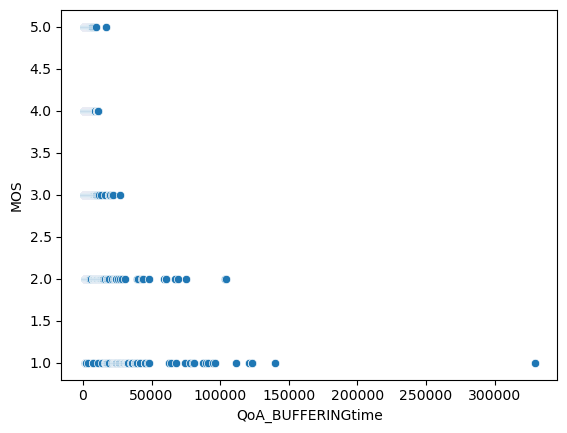

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(x='QoA_BUFFERINGtime', y='MOS', data=data)
plt.show()


In [10]:
# Select features for analysis
features = ['QoA_BUFFERINGtime', 'MOS'] 
data_selected = data[features]

In [11]:
# Normalize numerical features to bring them to the same scale
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
data_selected_scaled = pd.DataFrame(
    scaler.fit_transform(data_selected),
    columns=features
)


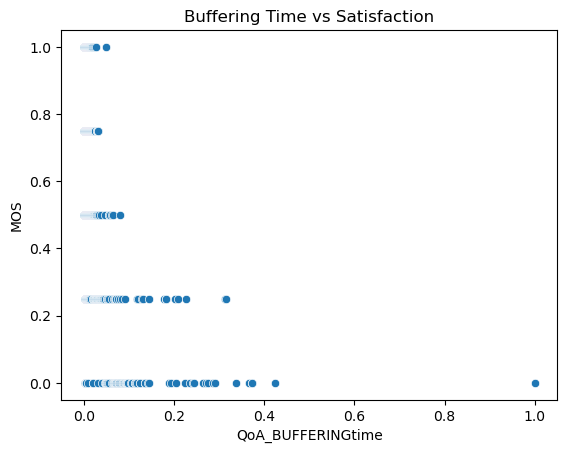

In [12]:
# exploring relationships and potential anomalies
sns.scatterplot(x='QoA_BUFFERINGtime', y='MOS', data=data_selected_scaled)
plt.title('Buffering Time vs Satisfaction')
plt.show()


                   QoA_BUFFERINGtime       MOS
QoA_BUFFERINGtime           1.000000 -0.482346
MOS                        -0.482346  1.000000


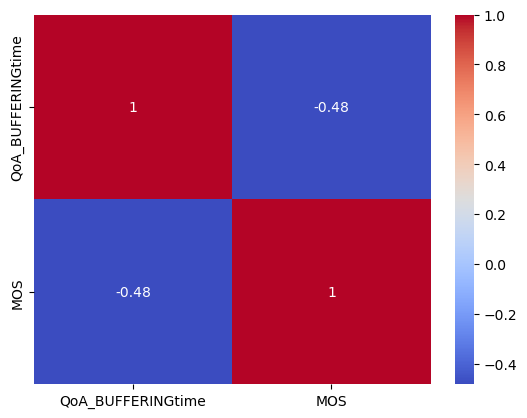

In [13]:
# Finding Correlation
print(data_selected.corr())
sns.heatmap(data_selected.corr(), annot=True, cmap='coolwarm')
plt.show()


In [46]:
# Using Z score
from scipy.stats import zscore

# Compute Z-scores
data_selected_scaled['z_score_buffering'] = zscore(data_selected_scaled['QoA_BUFFERINGtime'])
data_selected_scaled['z_score_satisfaction'] = zscore(data_selected_scaled['MOS'])

# Flag anomalies (e.g., Z-scores > 3 or < -3)
# Mark anomalies (±3 standard deviations)
data_selected_scaled['z_score_anomaly'] = (
    (data_selected_scaled['z_score_buffering'].abs() > 3) |
    (data_selected_scaled['z_score_satisfaction'].abs() > 3)
).astype(int)

# print(f"Number of anomalies detected: {len(anomalies)}")
print(data_selected_scaled['z_score_anomaly'].value_counts())

z_score_anomaly
0    1516
1      26
Name: count, dtype: int64


In [15]:
# Anomaly Detection Using Isolation Forest
from sklearn.ensemble import IsolationForest

iso = IsolationForest(contamination=0.05, random_state=42)  # 5% anomalies
data_selected_scaled['isolation_forest_anomaly'] = iso.fit_predict(data_selected_scaled[features])

# Convert Isolation Forest output: -1 for anomaly, 1 for normal
data_selected_scaled['isolation_forest_anomaly'] = data_selected_scaled['isolation_forest_anomaly'].apply(lambda x: 1 if x == -1 else 0)

# Compare results
print(data_selected_scaled[['z_score_anomaly', 'isolation_forest_anomaly']].value_counts())



z_score_anomaly  isolation_forest_anomaly
0                0                           1465
                 1                             51
1                1                             26
Name: count, dtype: int64


In [16]:
# Identifying rows that are considered anomalies by one method but not the other

# Anomalies detected by Z-Score but not by Isolation Forest
zscore_only = data_selected_scaled[(data_selected_scaled['z_score_anomaly'] == 1) & (data_selected_scaled['isolation_forest_anomaly'] == 0)]
print("Anomalies detected by Z-Score only:")
print(zscore_only)

# Anomalies detected by Isolation Forest but not by Z-Score
isolation_only = data_selected_scaled[(data_selected_scaled['z_score_anomaly'] == 0) & (data_selected_scaled['isolation_forest_anomaly'] == 1)]
print("Anomalies detected by Isolation Forest only:")
print(isolation_only)

# Anomalies detected by both methods
common_anomalies = data_selected_scaled[(data_selected_scaled['z_score_anomaly'] == 1) & (data_selected_scaled['isolation_forest_anomaly'] == 1)]
print("Common anomalies detected by both:")
print(common_anomalies)


Anomalies detected by Z-Score only:
Empty DataFrame
Columns: [QoA_BUFFERINGtime, MOS, z_score_buffering, z_score_satisfaction, z_score_anomaly, isolation_forest_anomaly]
Index: []
Anomalies detected by Isolation Forest only:
      QoA_BUFFERINGtime   MOS  z_score_buffering  z_score_satisfaction  \
86             0.001866  0.00          -0.324089             -2.558410   
120            0.002276  0.00          -0.315108             -2.558410   
190            0.002861  0.00          -0.302335             -2.558410   
294            0.003539  0.00          -0.287500             -2.558410   
314            0.003658  0.00          -0.284905             -2.558410   
423            0.004309  0.00          -0.270668             -2.558410   
482            0.004635  0.00          -0.263550             -2.558410   
563            0.005085  0.00          -0.253704             -2.558410   
584            0.005192  0.00          -0.251376             -2.558410   
619            0.005362  0.00      

In [17]:
# Investigate Z-Score anomalies
print("Characteristics of Z-Score anomalies:")
print(zscore_only.describe())

# Investigate Isolation Forest anomalies
print("Characteristics of Isolation Forest anomalies:")
print(isolation_only.describe())

# Investigate common anomalies
print("Characteristics of common anomalies:")
print(common_anomalies.describe())


Characteristics of Z-Score anomalies:
       QoA_BUFFERINGtime  MOS  z_score_buffering  z_score_satisfaction  \
count                0.0  0.0                0.0                   0.0   
mean                 NaN  NaN                NaN                   NaN   
std                  NaN  NaN                NaN                   NaN   
min                  NaN  NaN                NaN                   NaN   
25%                  NaN  NaN                NaN                   NaN   
50%                  NaN  NaN                NaN                   NaN   
75%                  NaN  NaN                NaN                   NaN   
max                  NaN  NaN                NaN                   NaN   

       z_score_anomaly  isolation_forest_anomaly  
count              0.0                       0.0  
mean               NaN                       NaN  
std                NaN                       NaN  
min                NaN                       NaN  
25%                NaN                  

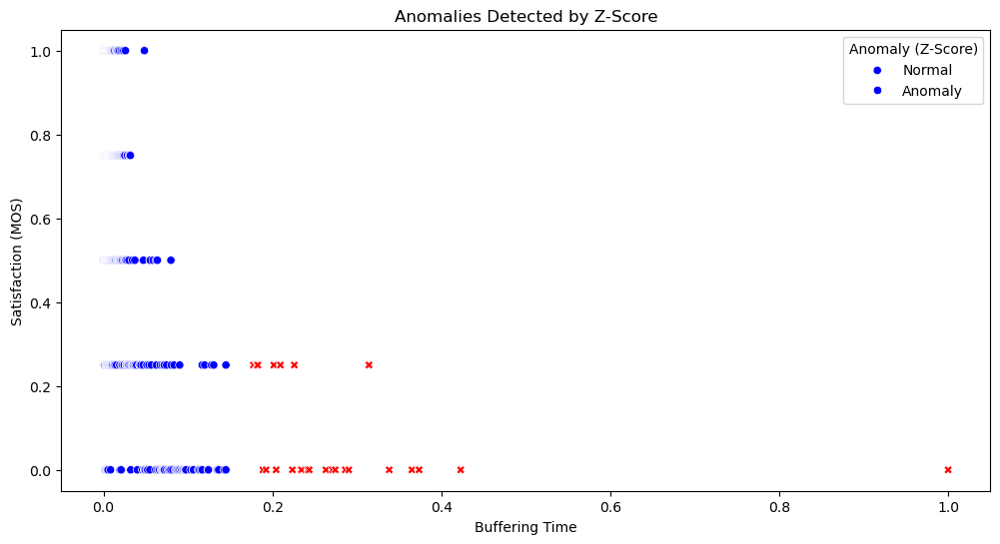

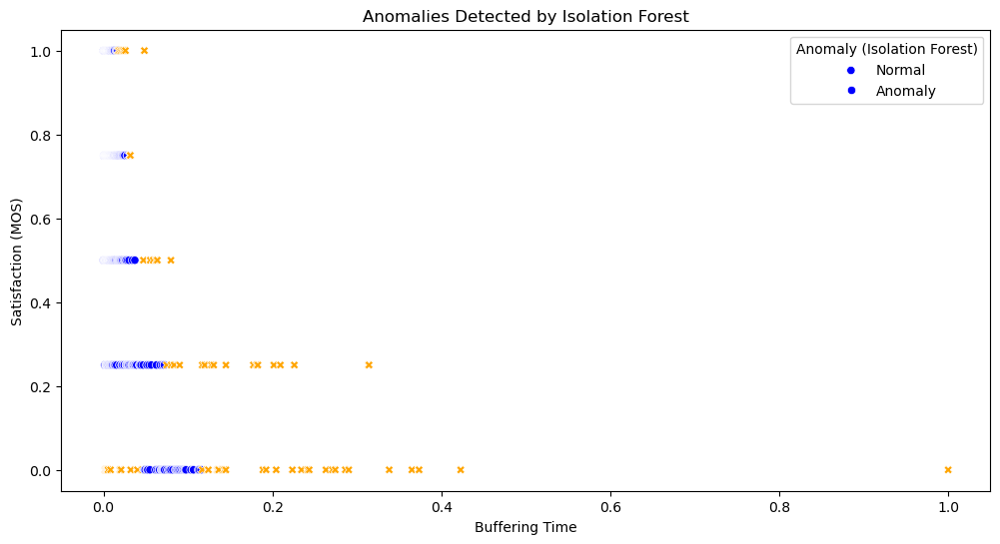

In [18]:

# Scatter plot: Z-Score anomalies
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x='QoA_BUFFERINGtime',
    y='MOS',
    data=data_selected_scaled,
    hue='z_score_anomaly',
    palette={0: 'blue', 1: 'red'},
    style='z_score_anomaly'
)
plt.title('Anomalies Detected by Z-Score')
plt.xlabel('Buffering Time')
plt.ylabel('Satisfaction (MOS)')
plt.legend(title='Anomaly (Z-Score)', labels=['Normal', 'Anomaly'])
plt.show()

# Scatter plot: Isolation Forest anomalies
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x='QoA_BUFFERINGtime',
    y='MOS',
    data=data_selected_scaled,
    hue='isolation_forest_anomaly',
    palette={0: 'blue', 1: 'orange'},
    style='isolation_forest_anomaly'
)
plt.title('Anomalies Detected by Isolation Forest')
plt.xlabel('Buffering Time')
plt.ylabel('Satisfaction (MOS)')
plt.legend(title='Anomaly (Isolation Forest)', labels=['Normal', 'Anomaly'])
plt.show()


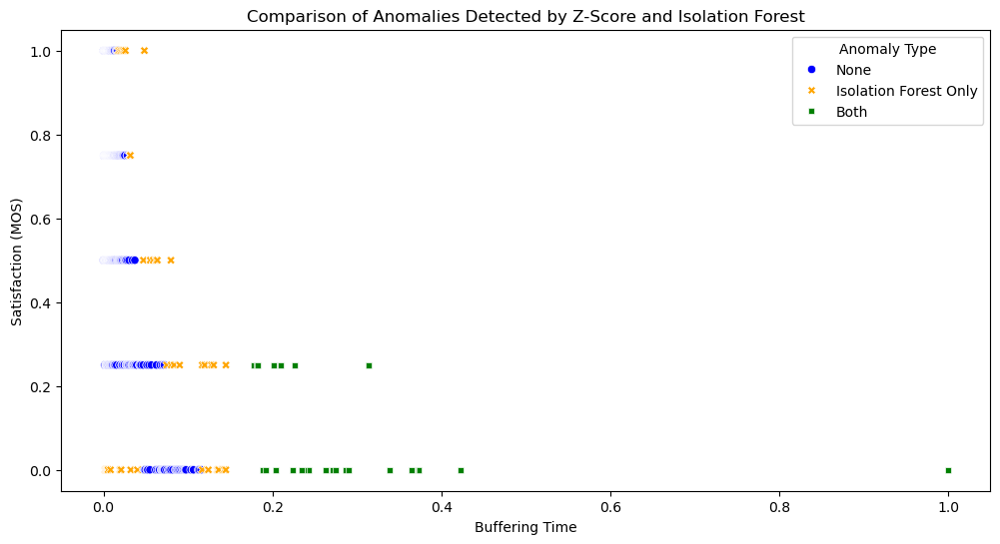

In [19]:
# Create a column to distinguish anomaly type
data_selected_scaled['anomaly_type'] = 'None'
data_selected_scaled.loc[zscore_only.index, 'anomaly_type'] = 'Z-Score Only'
data_selected_scaled.loc[isolation_only.index, 'anomaly_type'] = 'Isolation Forest Only'
data_selected_scaled.loc[common_anomalies.index, 'anomaly_type'] = 'Both'

# Scatter plot: Overlap of anomalies
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x='QoA_BUFFERINGtime',
    y='MOS',
    data=data_selected_scaled,
    hue='anomaly_type',
    style='anomaly_type',
    palette={'None': 'blue', 'Z-Score Only': 'red', 'Isolation Forest Only': 'orange', 'Both': 'green'}
)
plt.title('Comparison of Anomalies Detected by Z-Score and Isolation Forest')
plt.xlabel('Buffering Time')
plt.ylabel('Satisfaction (MOS)')
plt.legend(title='Anomaly Type')
plt.show()


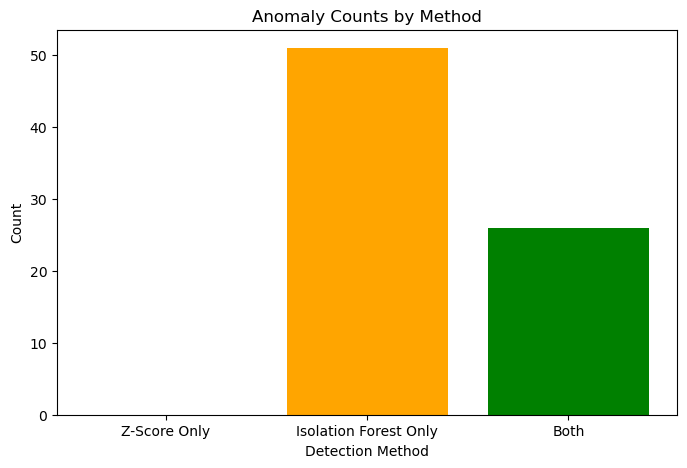

In [20]:
# Count anomalies by type
anomaly_counts = {
    'Z-Score Only': len(zscore_only),
    'Isolation Forest Only': len(isolation_only),
    'Both': len(common_anomalies)
}

# Create a bar plot
plt.figure(figsize=(8, 5))
plt.bar(anomaly_counts.keys(), anomaly_counts.values(), color=['red', 'orange', 'green'])
plt.title('Anomaly Counts by Method')
plt.ylabel('Count')
plt.xlabel('Detection Method')
plt.show()


/var/folders/qr/p596y49115zbhg_s900sljzh0000gn/T/ipykernel_15392/4119197386.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='any_anomaly', y='QoA_BUFFERINGtime', data=data_selected_scaled, palette=['blue', 'red'])


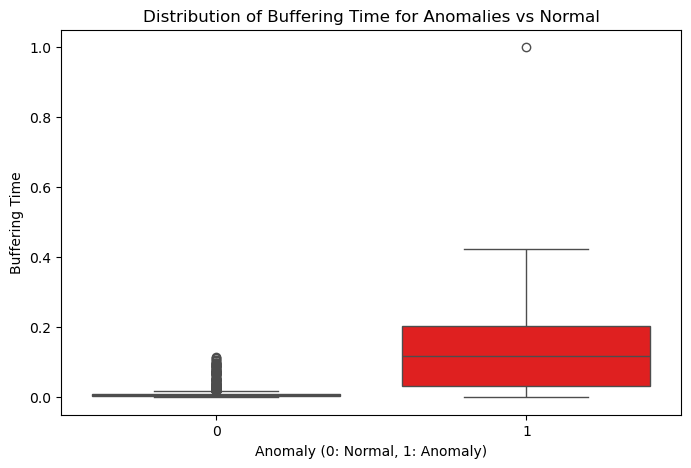

/var/folders/qr/p596y49115zbhg_s900sljzh0000gn/T/ipykernel_15392/4119197386.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='any_anomaly', y='MOS', data=data_selected_scaled, palette=['blue', 'red'])


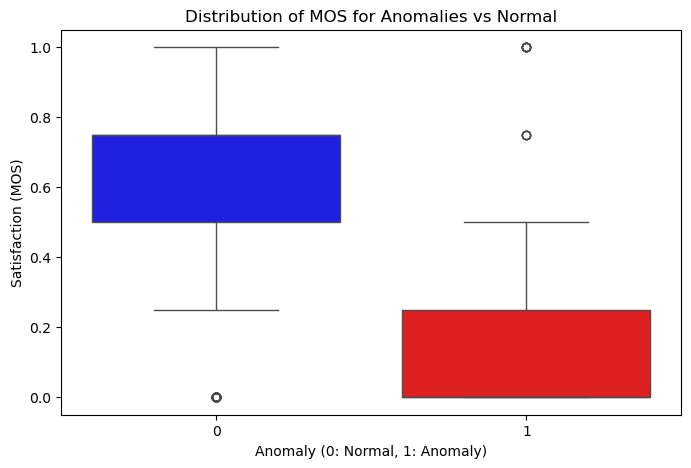

In [21]:
# Add a general anomaly label (1 if anomaly detected by any method, else 0)
data_selected_scaled['any_anomaly'] = ((data_selected_scaled['z_score_anomaly'] == 1) | (data_selected_scaled['isolation_forest_anomaly'] == 1)).astype(int)

# Boxplots for Buffering Time
plt.figure(figsize=(8, 5))
sns.boxplot(x='any_anomaly', y='QoA_BUFFERINGtime', data=data_selected_scaled, palette=['blue', 'red'])
plt.title('Distribution of Buffering Time for Anomalies vs Normal')
plt.xlabel('Anomaly (0: Normal, 1: Anomaly)')
plt.ylabel('Buffering Time')
plt.show()

# Boxplots for Satisfaction
plt.figure(figsize=(8, 5))
sns.boxplot(x='any_anomaly', y='MOS', data=data_selected_scaled, palette=['blue', 'red'])
plt.title('Distribution of MOS for Anomalies vs Normal')
plt.xlabel('Anomaly (0: Normal, 1: Anomaly)')
plt.ylabel('Satisfaction (MOS)')
plt.show()


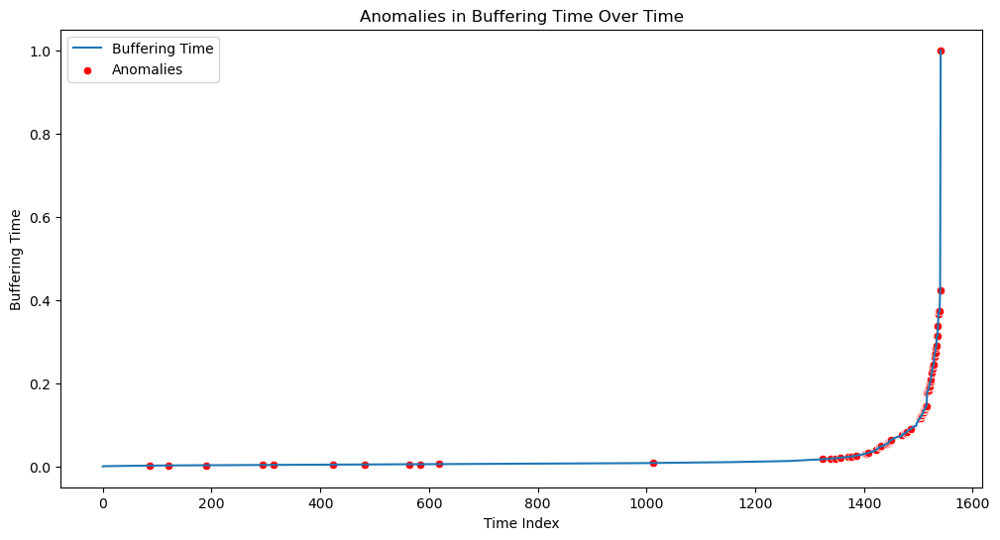

In [22]:
# Assuming the data has a time column, e.g., 'time_index'
data_selected_scaled['time_index'] = range(len(data_selected_scaled))  # Dummy time index is used as it is not present

plt.figure(figsize=(12, 6))
sns.lineplot(x='time_index', y='QoA_BUFFERINGtime', data=data_selected_scaled, label='Buffering Time')
sns.scatterplot(
    x='time_index',
    y='QoA_BUFFERINGtime',
    data=data_selected_scaled[data_selected_scaled['any_anomaly'] == 1],
    color='red',
    label='Anomalies'
)
plt.title('Anomalies in Buffering Time Over Time')
plt.xlabel('Time Index')
plt.ylabel('Buffering Time')
plt.legend()
plt.show()


In [23]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import numpy as np


# Select features for clustering
features = ['QoA_BUFFERINGtime', 'MOS']  # Adjust based on dataset columns
data_clustering = data_selected_scaled[features].copy()

# Normalize the data
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data_clustering)

# Apply DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust `eps` and `min_samples` based on the data
data_clustering['dbscan_cluster'] = dbscan.fit_predict(data_normalized)

# Anomalies are points in cluster -1
data_clustering['anomaly'] = (data_clustering['dbscan_cluster'] == -1).astype(int)

# Print the number of anomalies
num_anomalies = data_clustering['anomaly'].sum()
print(f"Number of anomalies detected: {num_anomalies}")

# Add anomaly labels to the original data for analysis
data_selected_scaled['dbscan_anomaly'] = data_clustering['anomaly']


Number of anomalies detected: 16


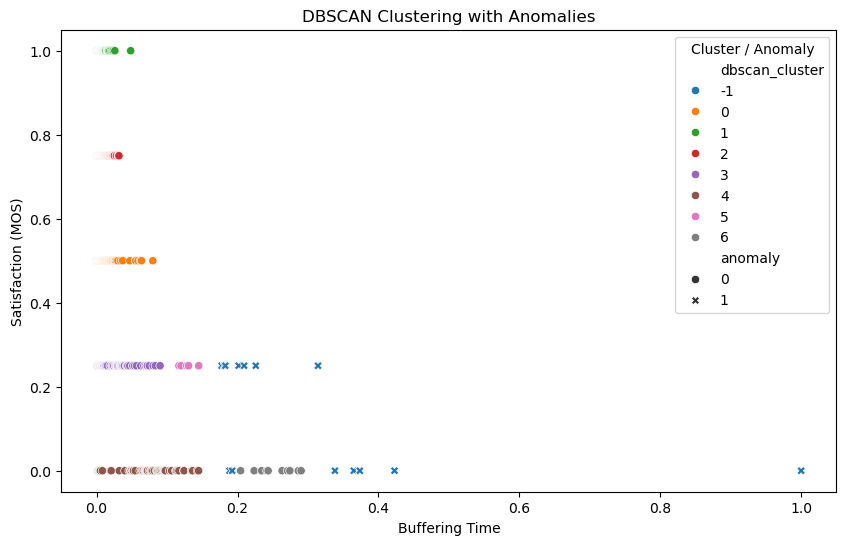

In [24]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='QoA_BUFFERINGtime',
    y='MOS',
    data=data_clustering,
    hue='dbscan_cluster',
    palette='tab10',
    style='anomaly',
    markers={0: 'o', 1: 'X'},
    legend='full'
)
plt.title('DBSCAN Clustering with Anomalies')
plt.xlabel('Buffering Time')
plt.ylabel('Satisfaction (MOS)')
plt.legend(title='Cluster / Anomaly')
plt.show()


/var/folders/qr/p596y49115zbhg_s900sljzh0000gn/T/ipykernel_15392/466716227.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette=['blue', 'red'])


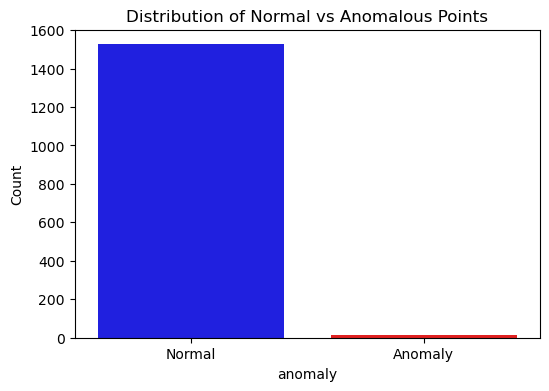

In [25]:
# Count anomalies and normal points
counts = data_clustering['anomaly'].value_counts()

# Bar plot for anomaly distribution
plt.figure(figsize=(6, 4))
sns.barplot(x=counts.index, y=counts.values, palette=['blue', 'red'])
plt.title('Distribution of Normal vs Anomalous Points')
plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
plt.ylabel('Count')
plt.show()


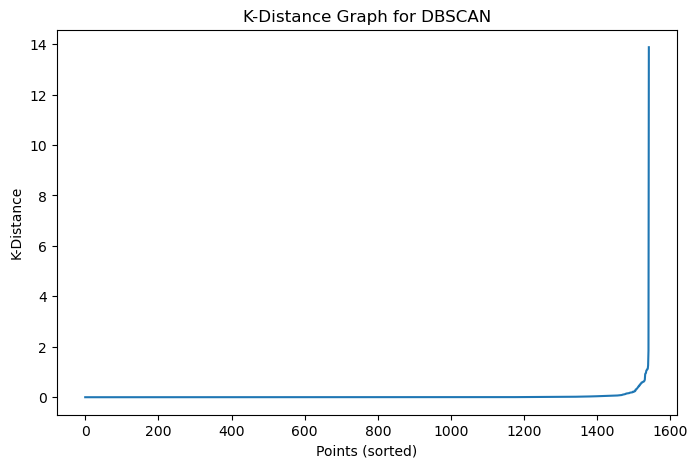

In [26]:
from sklearn.neighbors import NearestNeighbors

# Compute the k-distance graph
k = 5  # Same as min_samples
nbrs = NearestNeighbors(n_neighbors=k).fit(data_normalized)
distances, _ = nbrs.kneighbors(data_normalized)

# Plot the sorted k-distance graph
distances = np.sort(distances[:, k-1])  # Take the k-th nearest distance
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.title('K-Distance Graph for DBSCAN')
plt.xlabel('Points (sorted)')
plt.ylabel('K-Distance')
plt.show()


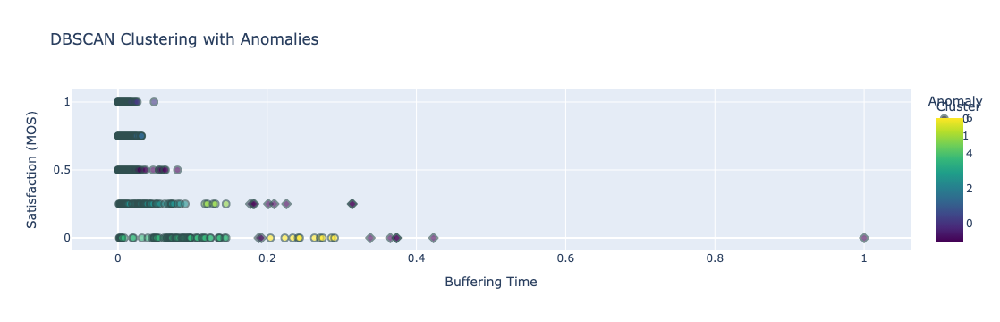

In [27]:
import plotly.express as px

# Create a scatter plot for clustering
fig = px.scatter(
    data_frame=data_clustering, 
    x='QoA_BUFFERINGtime', 
    y='MOS',
    color='dbscan_cluster',  # Color by cluster ID
    symbol='anomaly',  # Mark anomalies with a different symbol (X for anomalies)
    color_continuous_scale='Viridis',  # Color scheme for clusters
    labels={'dbscan_cluster': 'Cluster', 'anomaly': 'Anomaly'},
    title="DBSCAN Clustering with Anomalies"
)

# Update the plot with specific markers for anomalies
fig.update_traces(marker=dict(size=8, opacity=0.6, line=dict(width=2, color='DarkSlateGrey')))
fig.update_layout(
    xaxis_title="Buffering Time",
    yaxis_title="Satisfaction (MOS)",
    showlegend=True
)

# Show the plot
fig.show()


In [28]:
# Change pandas display options to show all rows and columns
pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_columns', None)  # Display all columns

In [29]:
data.describe()# Summary statistics for numerical columns


,id,user_id,QoA_VLCresolution,QoA_VLCbitrate,QoA_VLCframerate,QoA_VLCdropped,QoA_VLCaudiorate,QoA_VLCaudioloss,QoA_BUFFERINGcount,QoA_BUFFERINGtime,QoS_type,QoS_operator,QoD_api-level,QoU_sex,QoU_age,QoU_Ustedy,QoF_begin,QoF_shift,QoF_audio,QoF_video,MOS
count,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000,1542.000000
mean,924.634241,98.169261,354.562905,520.370471,25.001404,1.217899,40.377345,0.235409,1.391699,6167.588197,3.691310,3.052529,18.560311,0.856031,29.174449,4.881971,3.533074,4.523995,3.738651,3.884565,3.702335
std,525.458293,50.659434,25.947976,351.021115,6.692249,5.620186,9.126036,1.133968,0.896099,15036.507475,1.203786,0.974278,1.643008,0.351172,8.006733,0.471456,1.025886,0.953362,1.006686,0.887381,1.056598
min,52.000000,1.000000,16.000000,0.003294,0.000000,0.000000,0.000000,0.000000,1.000000,683.000000,1.000000,1.000000,15.000000,0.000000,14.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,473.250000,53.000000,360.000000,307.657940,24.733333,0.000000,43.783333,0.000000,1.000000,2011.250000,2.000000,3.000000,19.000000,1.000000,25.000000,5.000000,3.000000,4.000000,3.000000,4.000000,3.000000
50%,897.500000,117.000000,360.000000,473.932375,25.316667,0.000000,44.150000,0.000000,1.000000,2722.500000,4.000000,3.000000,19.000000,1.000000,27.000000,5.000000,4.000000,5.000000,4.000000,4.000000,4.000000
75%,1298.750000,135.000000,360.000000,661.426875,29.800000,1.000000,44.466667,0.000000,2.000000,4069.000000,5.000000,4.000000,19.000000,1.000000,30.000000,5.000000,4.000000,5.000000,4.000000,4.000000,4.000000
max,2077.000000,181.000000,360.000000,3918.293500,31.316667,107.000000,46.000000,14.000000,10.000000,329271.000000,5.000000,4.000000,22.000000,1.000000,55.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [30]:
# Some features, like QoA_VLCdropped, have a significant range, indicating potential outliers.
# Various columns, such as QoA_VLCframerate, show substantial variability

In [31]:
data.head()

,id,user_id,QoA_VLCresolution,QoA_VLCbitrate,QoA_VLCframerate,QoA_VLCdropped,QoA_VLCaudiorate,QoA_VLCaudioloss,QoA_BUFFERINGcount,QoA_BUFFERINGtime,QoS_type,QoS_operator,QoD_model,QoD_os-version,QoD_api-level,QoU_sex,QoU_age,QoU_Ustedy,QoF_begin,QoF_shift,QoF_audio,QoF_video,MOS
0,590,71,360,528.39294,24.950000,0,43.800000,0,2,683,4,2,HTC One X+,4.1.1(122573.16),16,1,20,5,3,5,3,4,3
1,428,46,360,402.64664,30.066667,0,44.200000,0,2,690,5,4,GT-I9195,4.4.2(I9195XXUCNK1),19,1,25,5,4,5,5,5,5
2,406,44,360,735.84070,24.200000,0,44.183333,0,2,840,2,2,GT-I9300,4.1.2(I9300XXELL4),16,1,22,5,3,5,4,4,4
3,1256,133,240,529.48830,24.116667,9,43.850000,0,2,868,2,2,D5803,4.4.4(suv3Rw),19,1,31,5,4,5,5,5,5
4,244,22,360,736.00085,24.066667,0,43.850000,0,2,869,4,4,GT-I9300,4.1.2(I9300XXELL4),16,0,26,5,5,5,4,5,5


In [32]:
data.tail()

,id,user_id,QoA_VLCresolution,QoA_VLCbitrate,QoA_VLCframerate,QoA_VLCdropped,QoA_VLCaudiorate,QoA_VLCaudioloss,QoA_BUFFERINGcount,QoA_BUFFERINGtime,QoS_type,QoS_operator,QoD_model,QoD_os-version,QoD_api-level,QoU_sex,QoU_age,QoU_Ustedy,QoF_begin,QoF_shift,QoF_audio,QoF_video,MOS
1538,881,113,360,37.281925,2.300000,1,4.216667,1,2,120628,1,3,D5803,4.4.4(suv3Rw),19,1,26,5,1,1,1,3,1
1539,908,117,360,43.191174,12.950000,24,19.016667,3,3,123318,1,3,D5803,4.4.4(suv3Rw),19,0,29,5,1,1,2,1,1
1540,1774,168,360,58.460570,4.250000,4,8.416667,1,4,123430,1,3,SM-G900F,5.0(G900FXXU1BOC2),21,1,27,5,1,1,1,1,1
1541,67,3,360,47.591620,0.133333,1,19.600000,2,3,139610,2,1,HTC One X+,4.1.1(122573.16),16,1,27,5,1,1,1,1,1
1542,1147,128,360,43.528040,6.633333,12,12.133333,0,4,329271,1,3,D5803,4.4.4(suv3Rw),19,1,27,5,1,1,1,1,1


In [33]:
data.shape

(1542, 23)

<function matplotlib.pyplot.show(close=None, block=None)>

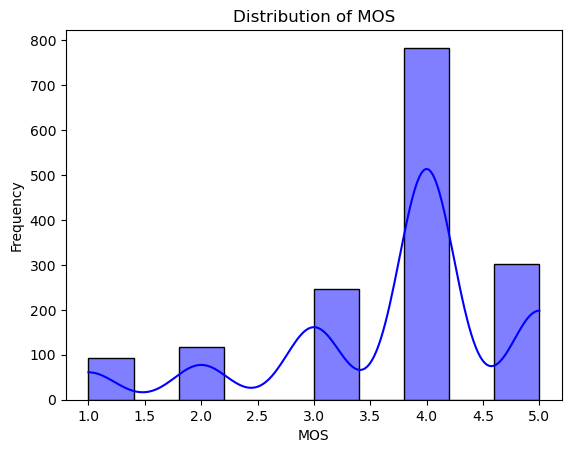

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# MOS distribution
sns.histplot(data['MOS'], bins=10, kde=True, color='blue')
plt.title('Distribution of MOS')
plt.xlabel('MOS')
plt.ylabel('Frequency')
plt.show



In [35]:
# univariate analysis to explore distributions and identify any apparent issues in the data

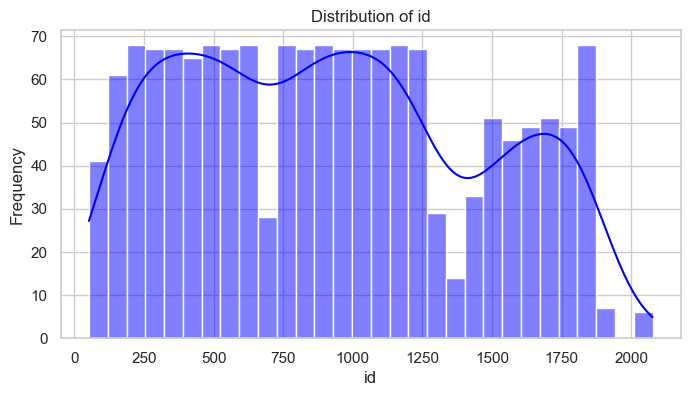

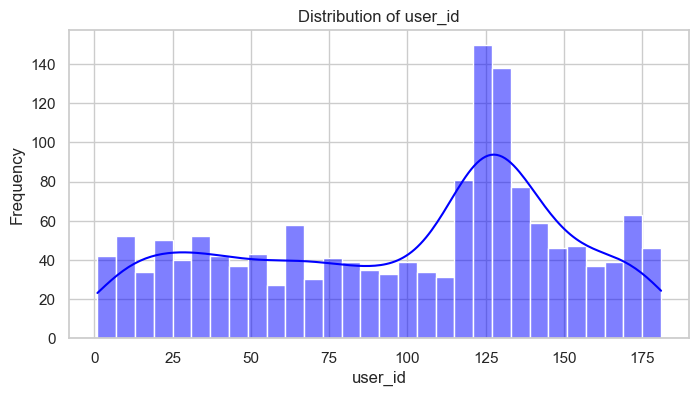

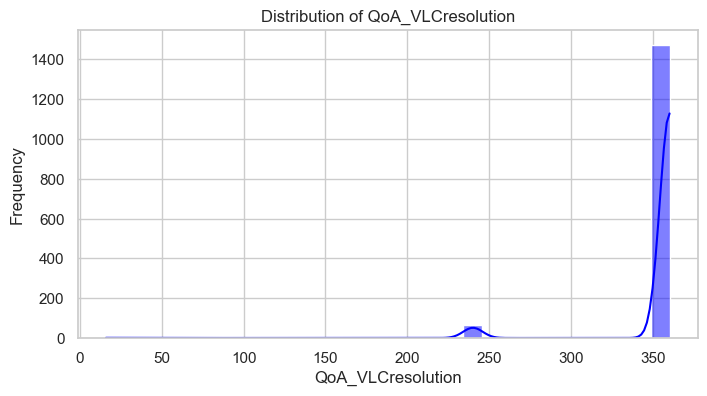

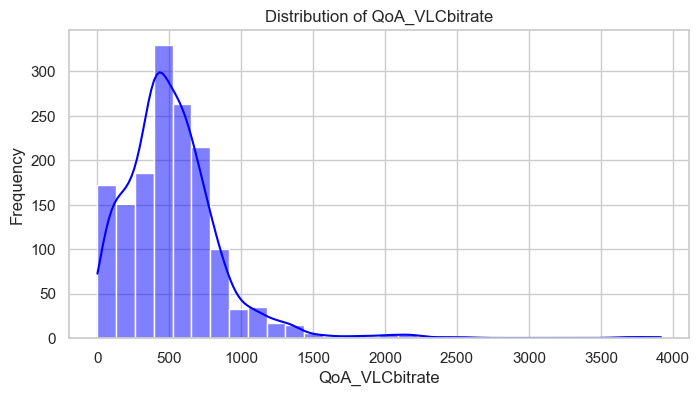

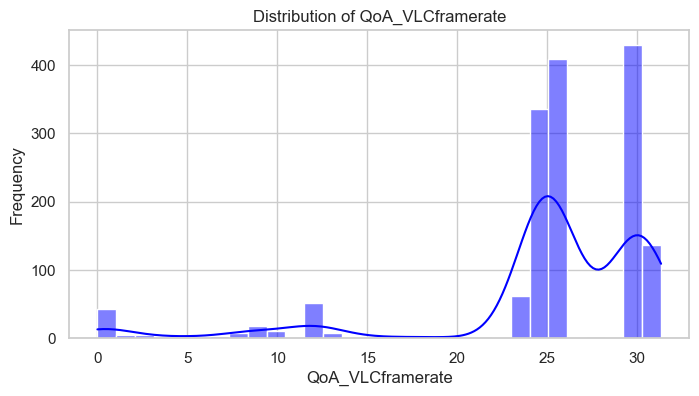

...

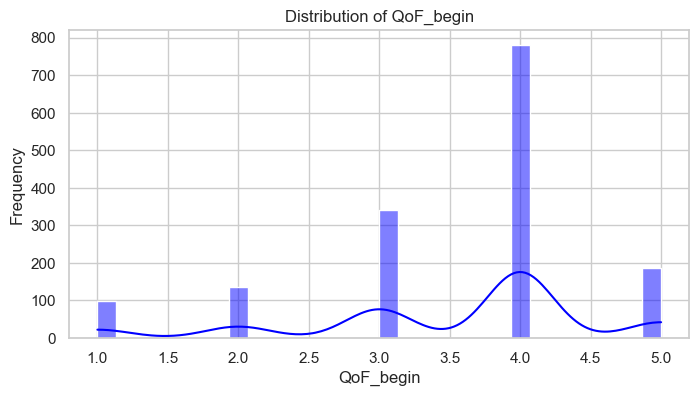

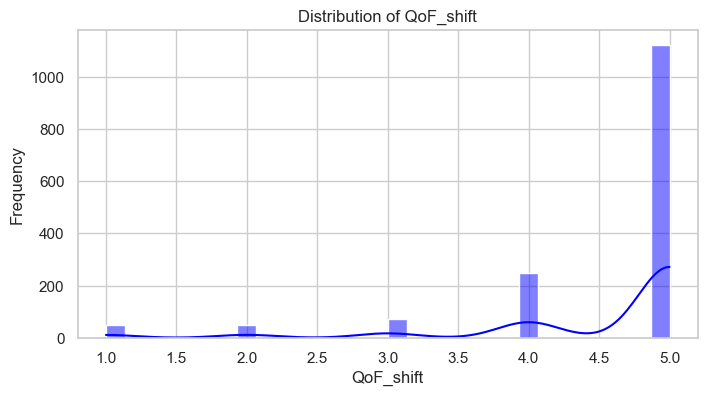

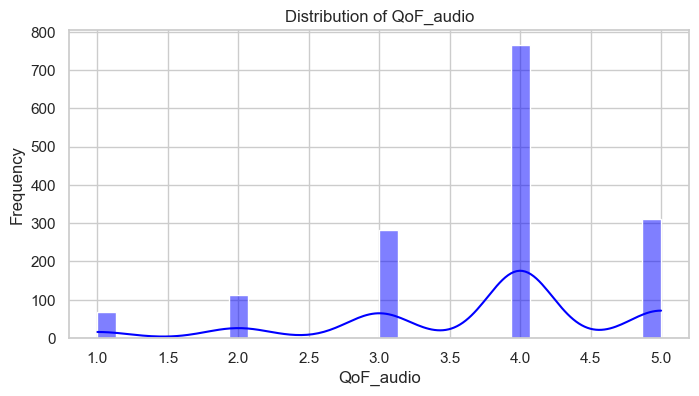

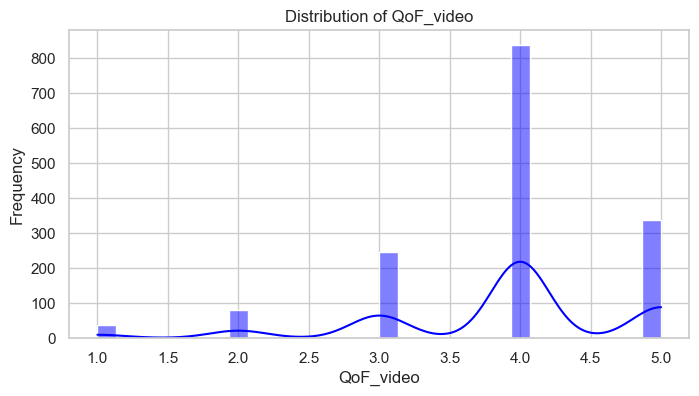

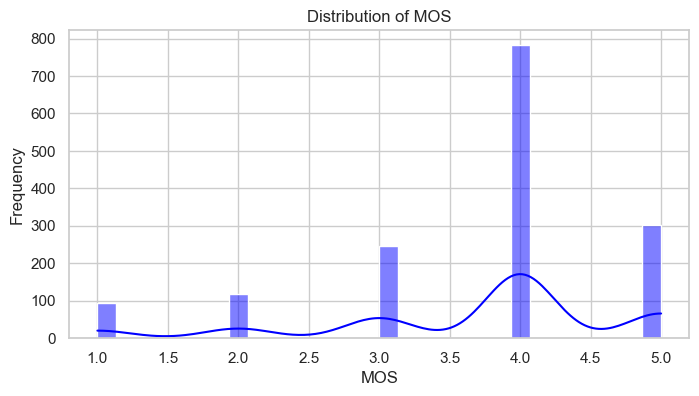

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Visualize distributions of numerical columns
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

# Plot distributions
for column in numeric_columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[column], kde=True, bins=30, color='blue')
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()


# Distribution Analysis

The distribution plots reveal patterns, outliers, and potential skewness for various numerical features.

## Key Observations

### Normal Distributions
- Features like `QoA_VLCaudiorate` seem to follow a near-normal distribution.

### Skewed Distributions
- Columns like `QoA_VLCdropped` and `QoA_BUFFERINGtime` exhibit heavy tails or extreme values.

### Potential Outliers
- Extreme values in `QoA_VLCdropped`, `QoA_BUFFERINGtime`, and other similar features warrant further investigation.

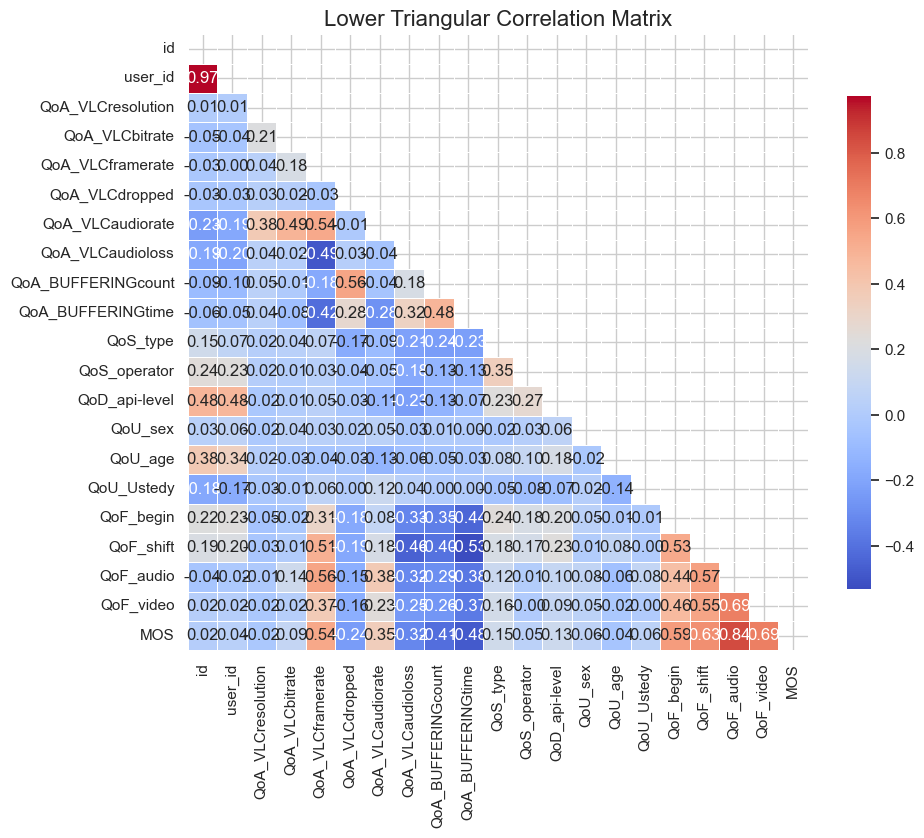

In [43]:
# Select only numerical columns for correlation calculation
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Compute correlation matrix for numerical columns
correlation_matrix = data[numerical_cols].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask
sns.heatmap(
    correlation_matrix, 
    mask=mask, 
    cmap='coolwarm',  # Choose a color palette
    annot=True,       # Annotate with correlation values
    fmt=".2f",        # Format for the annotations
    linewidths=0.5,   # Add lines between cells
    cbar_kws={"shrink": 0.8}  # Adjust colorbar size
)

plt.title("Lower Triangular Correlation Matrix", fontsize=16)
plt.savefig("correlation matrix")
plt.show()





# Key Insights from Correlation Analysis

## Strong Positive Correlations
- `QoA_VLCaudiorate` and `QoA_VLCframerate` are highly correlated.
- `QoA_BUFFERINGtime` and `QoA_BUFFERINGcount` show a strong positive correlation, which is expected given their related nature.

## Weak or No Correlation
- Features like `QoA_VLCdropped` and `QoF_audio` exhibit low correlation with most other variables.

## Potential Redundancy
- Features with very high correlation might introduce redundancy.
- **Dimensionality reduction methods** such as Principal Component Analysis (PCA) could help address this by reducing the dataset's dimensionality while retaining the most important information.

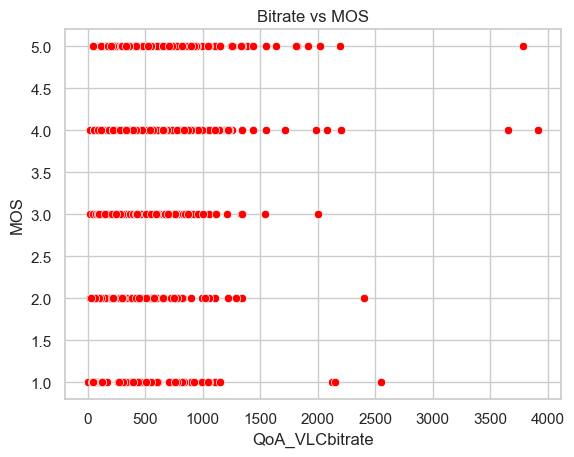

In [38]:
# Explore relationships between features and MOS
sns.scatterplot(x='QoA_VLCbitrate', y='MOS', data=data, color='red')
plt.title("Bitrate vs MOS")
plt.show()

Users might still rate a video poorly (low MOS) despite a high bitrate if they experience frequent buffering.

Hypothesis: Higher buffering time and count will negatively impact MOS, even if the bitrate is high.

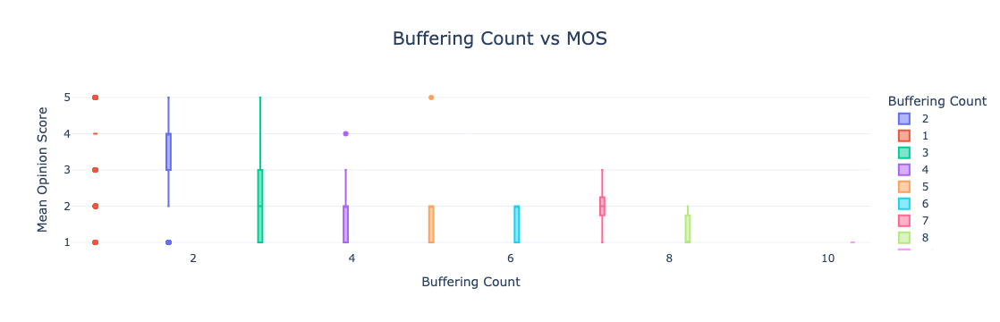

In [39]:
# Interactive Boxplot: Buffering Count vs MOS
fig = px.box(
    data, 
    x='QoA_BUFFERINGcount', 
    y='MOS', 
    color='QoA_BUFFERINGcount',  # Use buffering count as a color category
    title="Buffering Count vs MOS",
    labels={'QoA_BUFFERINGcount': 'Buffering Count', 'MOS': 'Mean Opinion Score'},
    template='plotly_white'
)

fig.update_layout(
    boxmode='group',  # Grouped boxplot mode
    title_font=dict(size=20),
    title_x=0.5  # Center the title
)

fig.show()


Dropped frames (QoA_VLCdropped) affect smoothness, which can degrade user experience. Investigate if dropped frames explain low MOS at high bitrates.

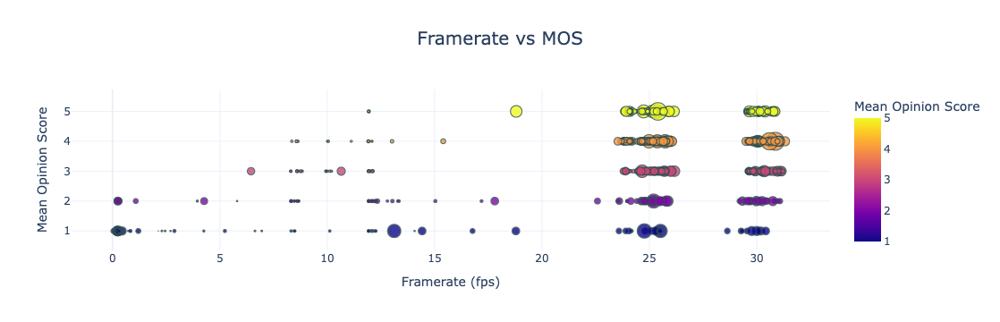

In [40]:
# Interactive Scatterplot: Framerate vs MOS
fig = px.scatter(
    data, 
    x='QoA_VLCframerate', 
    y='MOS', 
    color='MOS',
    size='QoA_VLCbitrate',  # Bubble size based on bitrate
    title="Framerate vs MOS",
    labels={'QoA_VLCframerate': 'Framerate (fps)', 'MOS': 'Mean Opinion Score'},
    template='plotly_white'
)

fig.update_traces(marker=dict(opacity=0.8, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(title_font=dict(size=20), title_x=0.5)

fig.show()


Long buffering times typically frustrate users. Check if there’s a strong negative correlation between buffering time and MOS.

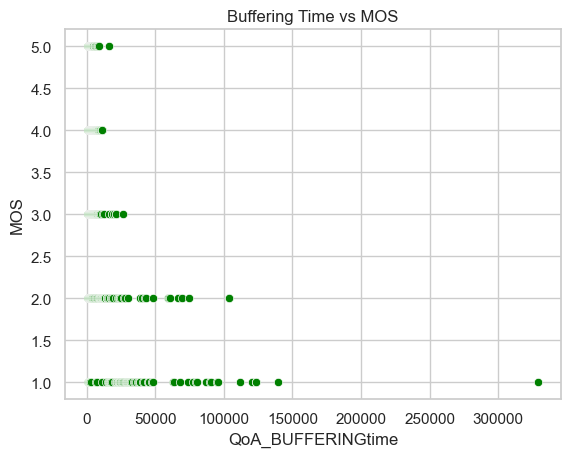

In [41]:
sns.scatterplot(x='QoA_BUFFERINGtime', y='MOS', data=data, color='green')
plt.title("Buffering Time vs MOS")
plt.show()

Dropped frames impact video smoothness, and higher dropped frames usually reduce MOS.
Check if there’s a threshold beyond which MOS starts to drop drastically.

/var/folders/qr/p596y49115zbhg_s900sljzh0000gn/T/ipykernel_15392/2105660751.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




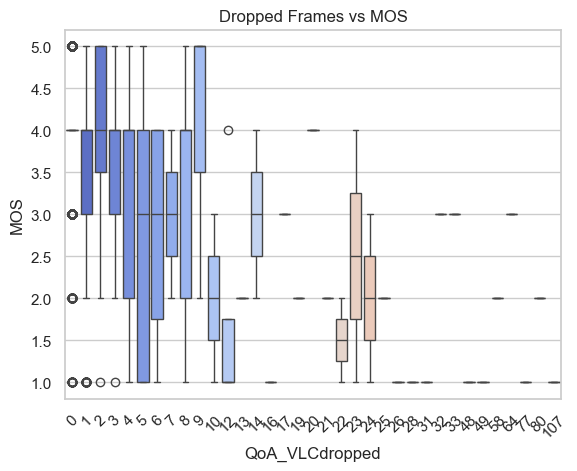

In [42]:
# sns.boxplot(x='QoA_VLCdropped', y='MOS', data=data, palette='coolwarm')
# plt.title("Dropped Frames vs MOS")
# plt.show()
sns.boxplot(x='QoA_VLCdropped', y='MOS', data=data, palette='coolwarm')
plt.title("Dropped Frames vs MOS")
plt.xticks(rotation=45)  # Rotate x-axis ticks by 45 degrees
plt.show()


In [118]:
# Step 3: Convert Data Types if Necessary (e.g., 'QoU_sex' as categorical)
data['QoU_sex'] = data['QoU_sex'].astype('category')
data['QoS_operator'] = data['QoS_operator'].astype('category')
data['QoD_os-version'] = data['QoD_os-version'].astype('category')
data['QoD_model'] = data['QoD_model'].astype('category')



In [119]:
data.head(10)

,id,user_id,QoA_VLCresolution,QoA_VLCbitrate,QoA_VLCframerate,QoA_VLCdropped,QoA_VLCaudiorate,QoA_VLCaudioloss,QoA_BUFFERINGcount,QoA_BUFFERINGtime,QoS_type,QoS_operator,QoD_model,QoD_os-version,QoD_api-level,QoU_sex,QoU_age,QoU_Ustedy,QoF_begin,QoF_shift,QoF_audio,QoF_video,MOS
0,590,71,360,528.39294,24.950000,0,43.800000,0,2,683,4,2,HTC One X+,4.1.1(122573.16),16,1,20,5,3,5,3,4,3
1,428,46,360,402.64664,30.066667,0,44.200000,0,2,690,5,4,GT-I9195,4.4.2(I9195XXUCNK1),19,1,25,5,4,5,5,5,5
2,406,44,360,735.84070,24.200000,0,44.183333,0,2,840,2,2,GT-I9300,4.1.2(I9300XXELL4),16,1,22,5,3,5,4,4,4
3,1256,133,240,529.48830,24.116667,9,43.850000,0,2,868,2,2,D5803,4.4.4(suv3Rw),19,1,31,5,4,5,5,5,5
4,244,22,360,736.00085,24.066667,0,43.850000,0,2,869,4,4,GT-I9300,4.1.2(I9300XXELL4),16,0,26,5,5,5,4,5,5
5,179,13,360,528.58900,24.800000,1,43.800000,0,2,873,3,4,GT-I9195,4.4.2(I9195XXUCNK1),19,1,29,5,5,5,4,5,4
6,464,52,360,658.07920,24.733333,0,43.800000,0,2,876,5,4,SM-G900F,4.4.2(G900FXXU1ANG2),19,1,26,5,4,5,5,5,5
7,273,26,360,565.17450,25.050000,0,44.483333,0,2,887,4,4,GT-I9195,4.4.2(I9195XXUCNK1),19,1,33,5,3,5,5,4,4
8,395,42,360,567.29980,24.700000,0,43.783333,0,2,890,5,4,HTC One X+,4.1.1(122573.16),16,1,26,5,2,5,4,4,3
9,363,38,360,217.11320,30.000000,0,43.966667,0,2,912,4,2,GT-I9195,4.4.2(I9195XXUCNK1),19,0,19,5,4,5,4,5,4


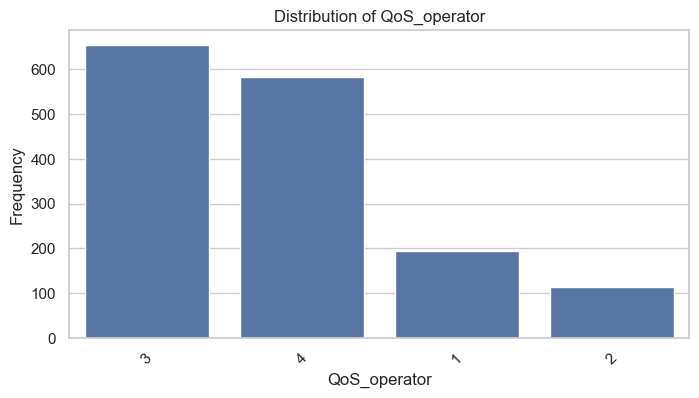

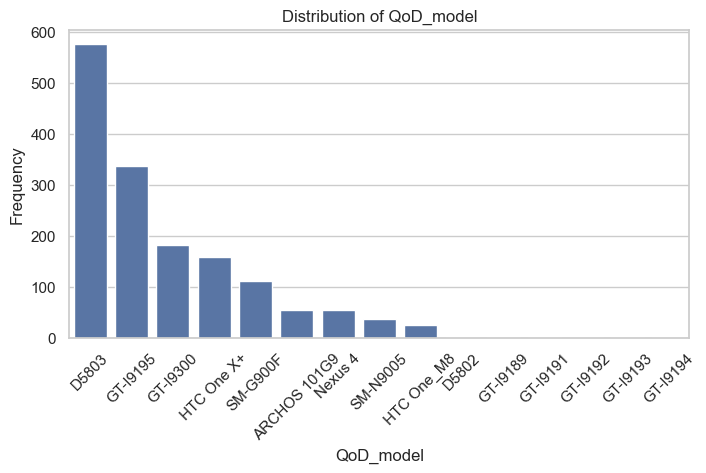

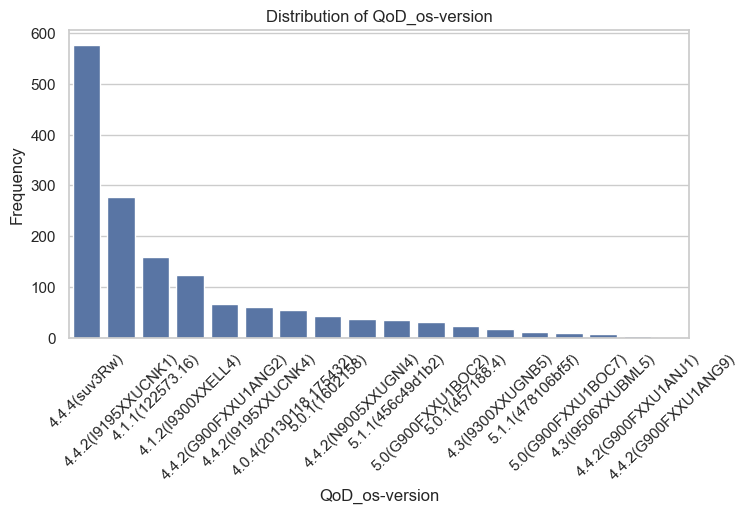

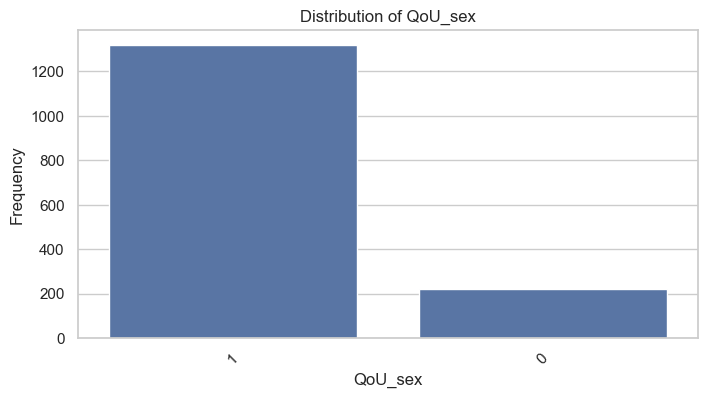

In [120]:
# Identify categorical columns
categorical_columns = data.select_dtypes(include=['category']).columns

# Plot distributions for categorical features
for column in categorical_columns:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=data, x=column, order=data[column].value_counts().index)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)
    plt.show()


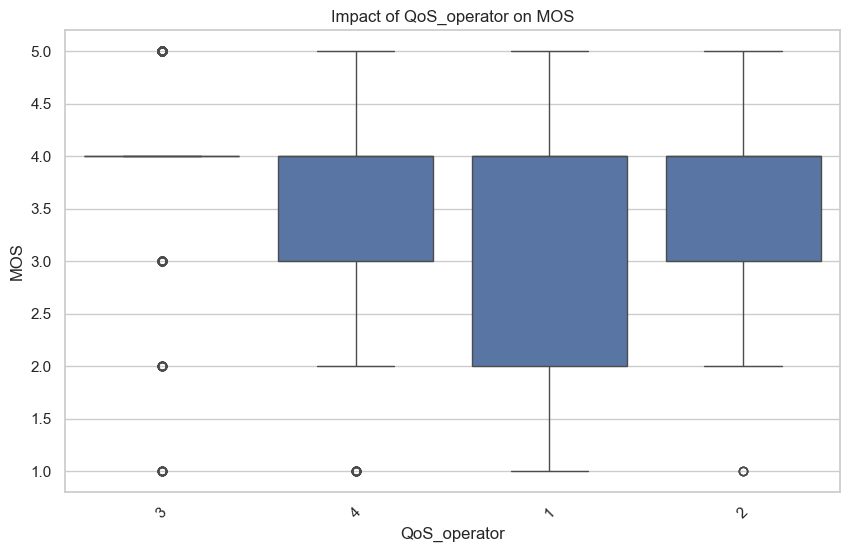

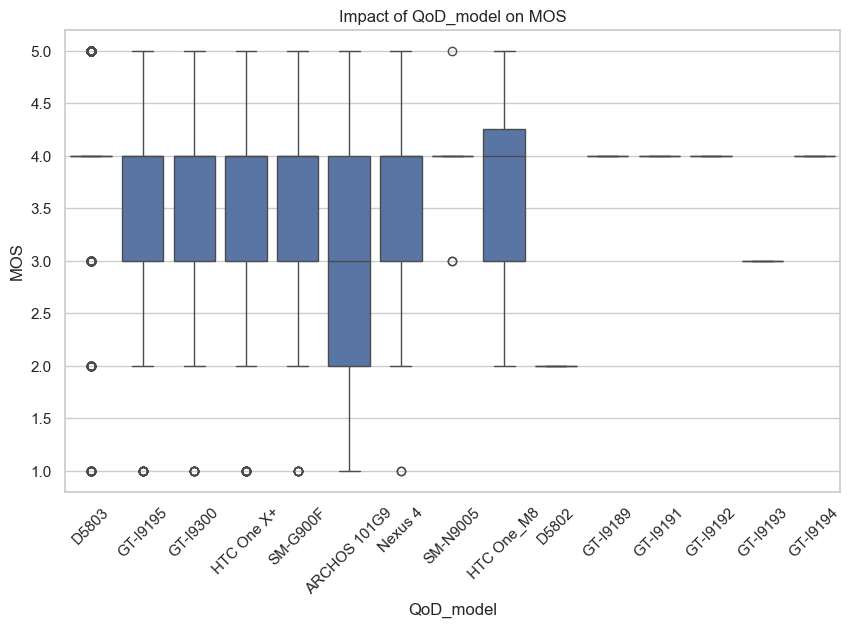

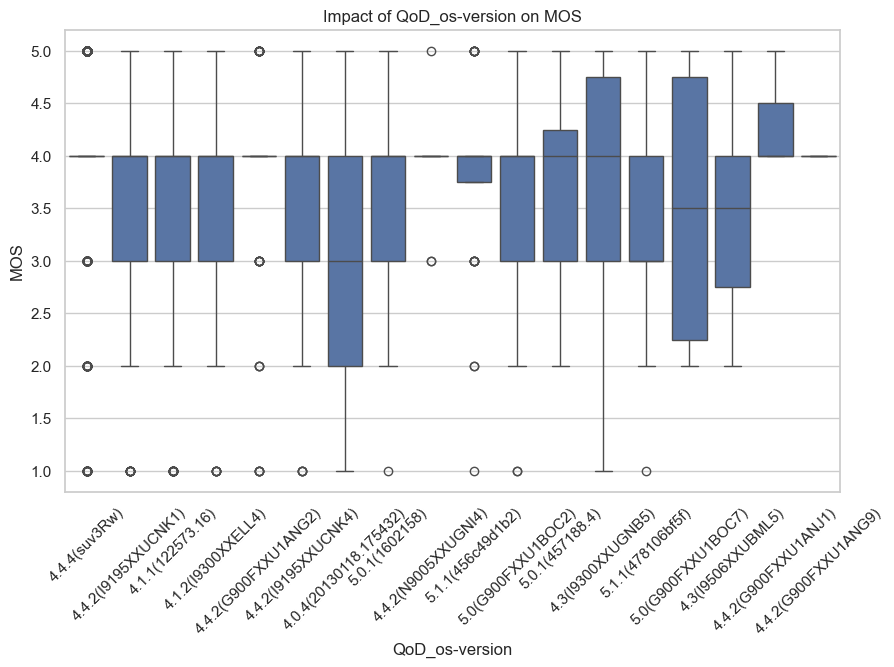

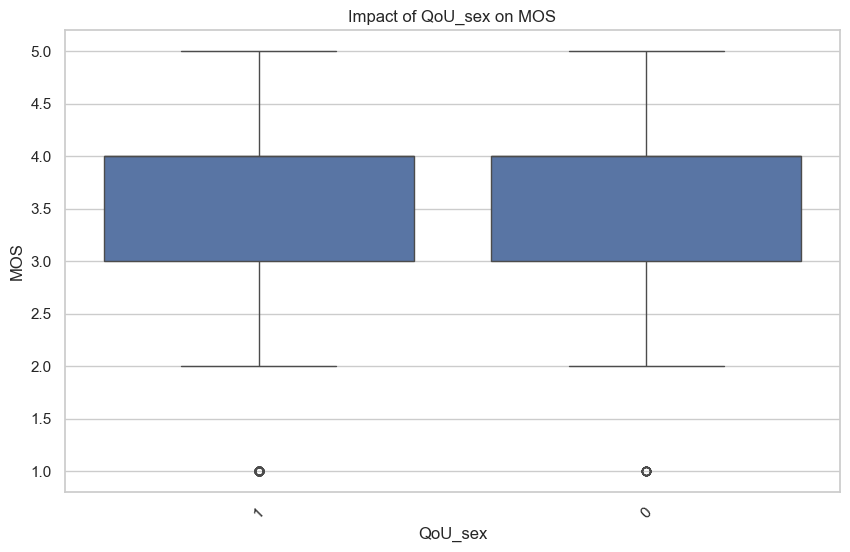

In [122]:
# Plot boxplots to visualize the impact of categorical features on `MOS`
for column in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=data, x=column, y='MOS', order=data[column].value_counts().index)
    plt.title(f"Impact of {column} on MOS")
    plt.xlabel(column)
    plt.ylabel("MOS")
    plt.xticks(rotation=45)
    plt.show()


# Observations on the Impact of Categorical Features on MOS

## **QoD_model**
- There is noticeable variation in MOS across different device models.
- Certain models consistently exhibit higher or lower median MOS values, indicating potential quality differences linked to the hardware or design of specific models.

## **QoD_os-version**
- The operating system version also influences MOS significantly.
- Some OS versions are associated with notably higher or lower MOS values, suggesting that system-level optimizations, compatibility, or performance differences may directly affect user satisfaction.

In [125]:
data[data['QoS_operator']==4]['MOS'].value_counts()

MOS
4    253
3    125
5    117
2     53
1     33
Name: count, dtype: int64

In [127]:
data[data['QoS_operator']==3]['MOS'].value_counts()

MOS
4    406
5    119
3     73
2     30
1     26
Name: count, dtype: int64

In [135]:
data[data['QoS_operator']==2]['MOS'].value_counts()

MOS
4    44
5    26
3    24
2    16
1     4
Name: count, dtype: int64

In [136]:
data[data['QoS_operator']==1]['MOS'].value_counts()

MOS
4    80
5    40
1    30
3    24
2    19
Name: count, dtype: int64

In [128]:
# Analyze interactions between categorical variables

In [131]:
# Create cross-tabulations to explore interactions between categorical variables
cross_tabs = {}

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            cross_tab = pd.crosstab(data[col1], data[col2])
            cross_tabs[f"{col1} x {col2}"] = cross_tab

# Display cross-tabulation for analysis
selected_interaction = list(cross_tabs.keys())[0]  # Example: Select the first interaction
selected_cross_tab = cross_tabs[selected_interaction]


In [134]:
print(selected_interaction)
selected_cross_tab

QoS_operator x QoD_model


QoD_model,ARCHOS 101G9,D5802,D5803,GT-I9189,GT-I9191,GT-I9192,GT-I9193,GT-I9194,GT-I9195,GT-I9300,HTC One X+,HTC One_M8,Nexus 4,SM-G900F,SM-N9005
QoS_operator,,,,,,,,,,,,,,,
1,8,0,30,0,0,0,0,0,58,10,75,0,0,12,0
2,5,0,11,0,0,0,0,0,23,57,14,0,0,4,0
3,11,0,451,0,0,0,0,0,62,16,18,5,23,36,32
4,31,1,84,1,1,1,1,1,195,98,52,19,32,59,5


Key Observations:
Some QoD_model entries are strongly associated with specific QoD_os-version entries.
There is significant sparsity in the table, indicating that certain combinations of models and OS versions are either rare or nonexistent.

## Retention model

In [9]:
# Define the target variable
data['retention'] = data['MOS'].apply(lambda x: 1 if x >= 4 else 0)

In [10]:
# Drop the original MOS column if no longer needed
data.drop(columns=['MOS'], inplace=True)

In [11]:
data.head()

,id,user_id,QoA_VLCresolution,QoA_VLCbitrate,QoA_VLCframerate,QoA_VLCdropped,QoA_VLCaudiorate,QoA_VLCaudioloss,QoA_BUFFERINGcount,QoA_BUFFERINGtime,QoS_type,QoS_operator,QoD_model,QoD_os-version,QoD_api-level,QoU_sex,QoU_age,QoU_Ustedy,QoF_begin,QoF_shift,QoF_audio,QoF_video,retention
0,590,71,360,528.39294,24.950000,0,43.800000,0,2,683,4,2,HTC One X+,4.1.1(122573.16),16,1,20,5,3,5,3,4,0
1,428,46,360,402.64664,30.066667,0,44.200000,0,2,690,5,4,GT-I9195,4.4.2(I9195XXUCNK1),19,1,25,5,4,5,5,5,1
2,406,44,360,735.84070,24.200000,0,44.183333,0,2,840,2,2,GT-I9300,4.1.2(I9300XXELL4),16,1,22,5,3,5,4,4,1
3,1256,133,240,529.48830,24.116667,9,43.850000,0,2,868,2,2,D5803,4.4.4(suv3Rw),19,1,31,5,4,5,5,5,1
4,244,22,360,736.00085,24.066667,0,43.850000,0,2,869,4,4,GT-I9300,4.1.2(I9300XXELL4),16,0,26,5,5,5,4,5,1


In [12]:
# Check for missing values
print(data.isnull().sum())


id                    0
user_id               0
QoA_VLCresolution     0
QoA_VLCbitrate        0
QoA_VLCframerate      0
QoA_VLCdropped        0
QoA_VLCaudiorate      0
QoA_VLCaudioloss      0
QoA_BUFFERINGcount    0
QoA_BUFFERINGtime     0
QoS_type              0
QoS_operator          0
QoD_model             0
QoD_os-version        0
QoD_api-level         0
QoU_sex               0
QoU_age               0
QoU_Ustedy            0
QoF_begin             0
QoF_shift             0
QoF_audio             0
QoF_video             0
retention             0
dtype: int64


In [13]:
# Fill missing values for numerical and categorical columns
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = data.select_dtypes(include=['object']).columns


In [14]:
numerical_cols

Index(['id', 'user_id', 'QoA_VLCresolution', 'QoA_VLCbitrate',
       'QoA_VLCframerate', 'QoA_VLCdropped', 'QoA_VLCaudiorate',
       'QoA_VLCaudioloss', 'QoA_BUFFERINGcount', 'QoA_BUFFERINGtime',
       'QoS_type', 'QoS_operator', 'QoD_api-level', 'QoU_sex', 'QoU_age',
       'QoU_Ustedy', 'QoF_begin', 'QoF_shift', 'QoF_audio', 'QoF_video',
       'retention'],
      dtype='object')

In [15]:
categorical_cols

Index(['QoD_model', 'QoD_os-version'], dtype='object')

In [16]:
# Fill numerical columns with mean
data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())


In [17]:
# Fill categorical columns with mode
for col in categorical_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

/var/folders/qr/p596y49115zbhg_s900sljzh0000gn/T/ipykernel_89048/3347855258.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mode()[0], inplace=True)


In [18]:
from sklearn.preprocessing import LabelEncoder

# Example: Label encoding for QoU_sex
label_enc = LabelEncoder()
data['QoU_sex'] = label_enc.fit_transform(data['QoU_sex'])


In [19]:
data['QoD_os-version'].value_counts()

QoD_os-version
4.4.4(suv3Rw)             577
4.4.2(I9195XXUCNK1)       278
4.1.1(122573.16)          159
4.1.2(I9300XXELL4)        123
4.4.2(G900FXXU1ANG2)       67
4.4.2(I9195XXUCNK4)        61
4.0.4(20130118.175432)     55
5.0.1(1602158)             44
4.4.2(N9005XXUGNI4)        37
5.1.1(456c49d1b2)          36
5.0(G900FXXU1BOC2)         31
5.0.1(457188.4)            24
4.3(I9300XXUGNB5)          18
5.1.1(478106bf5f)          11
5.0(G900FXXU1BOC7)         10
4.3(I9506XXUBML5)           8
4.4.2(G900FXXU1ANJ1)        3
4.4.2(G900FXXU1ANG9)        1
Name: count, dtype: int64

In [20]:
# One-hot encoding for QoD_os-version (if it has many unique values)
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)

In [21]:
data.head()

,id,user_id,QoA_VLCresolution,QoA_VLCbitrate,QoA_VLCframerate,QoA_VLCdropped,QoA_VLCaudiorate,QoA_VLCaudioloss,QoA_BUFFERINGcount,QoA_BUFFERINGtime,QoS_type,QoS_operator,QoD_api-level,QoU_sex,QoU_age,QoU_Ustedy,QoF_begin,QoF_shift,QoF_audio,QoF_video,retention,QoD_model_D5802,QoD_model_D5803,QoD_model_GT-I9189,QoD_model_GT-I9191,QoD_model_GT-I9192,QoD_model_GT-I9193,QoD_model_GT-I9194,QoD_model_GT-I9195,QoD_model_GT-I9300,QoD_model_HTC One X+,QoD_model_HTC One_M8,QoD_model_Nexus 4,QoD_model_SM-G900F,QoD_model_SM-N9005,QoD_os-version_4.1.1(122573.16),QoD_os-version_4.1.2(I9300XXELL4),QoD_os-version_4.3(I9300XXUGNB5),QoD_os-version_4.3(I9506XXUBML5),QoD_os-version_4.4.2(G900FXXU1ANG2),QoD_os-version_4.4.2(G900FXXU1ANG9),QoD_os-version_4.4.2(G900FXXU1ANJ1),QoD_os-version_4.4.2(I9195XXUCNK1),QoD_os-version_4.4.2(I9195XXUCNK4),QoD_os-version_4.4.2(N9005XXUGNI4),QoD_os-version_4.4.4(suv3Rw),QoD_os-version_5.0(G900FXXU1BOC2),QoD_os-version_5.0(G900FXXU1BOC7),QoD_os-version_5.0.1(1602158),QoD_os-version_5.0.1(457188.4),QoD_os-version_5.1.1(456c49d1b2),QoD_os-version_5.1.1(478106bf5f)
0,590,71,360,528.39294,24.950000,0,43.800000,0,2,683,4,2,16,1,20,5,3,5,3,4,0,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,428,46,360,402.64664,30.066667,0,44.200000,0,2,690,5,4,19,1,25,5,4,5,5,5,1,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
2,406,44,360,735.84070,24.200000,0,44.183333,0,2,840,2,2,16,1,22,5,3,5,4,4,1,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,1256,133,240,529.48830,24.116667,9,43.850000,0,2,868,2,2,19,1,31,5,4,5,5,5,1,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False
4,244,22,360,736.00085,24.066667,0,43.850000,0,2,869,4,4,16,0,26,5,5,5,4,5,1,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [22]:
from sklearn.preprocessing import StandardScaler

# # Standardize numerical columns
# scaler = StandardScaler()
# numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
# data[numerical_cols] = scaler.fit_transform(data[numerical_cols])


In [23]:
numerical_cols

Index(['id', 'user_id', 'QoA_VLCresolution', 'QoA_VLCbitrate',
       'QoA_VLCframerate', 'QoA_VLCdropped', 'QoA_VLCaudiorate',
       'QoA_VLCaudioloss', 'QoA_BUFFERINGcount', 'QoA_BUFFERINGtime',
       'QoS_type', 'QoS_operator', 'QoD_api-level', 'QoU_sex', 'QoU_age',
       'QoU_Ustedy', 'QoF_begin', 'QoF_shift', 'QoF_audio', 'QoF_video',
       'retention'],
      dtype='object')

In [24]:
from sklearn.model_selection import train_test_split,GridSearchCV

# Define features and target
X = data.drop(columns=['retention', 'id', 'user_id'])  # Drop target and irrelevant columns
y = data['retention'].astype(int) 


# Standardize only the numerical feature columns (X)
scaler = StandardScaler()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])


# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


In [25]:
y_train.unique()

array([0, 1])

In [26]:
from sklearn.ensemble import RandomForestClassifier

# Initialize and train the model
clf = RandomForestClassifier(random_state=42, n_estimators=100)
clf.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [27]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Predict on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Accuracy: 0.8920086393088553
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.83      0.82       137
           1       0.93      0.92      0.92       326

    accuracy                           0.89       463
   macro avg       0.87      0.87      0.87       463
weighted avg       0.89      0.89      0.89       463

Confusion Matrix:
 [[114  23]
 [ 27 299]]


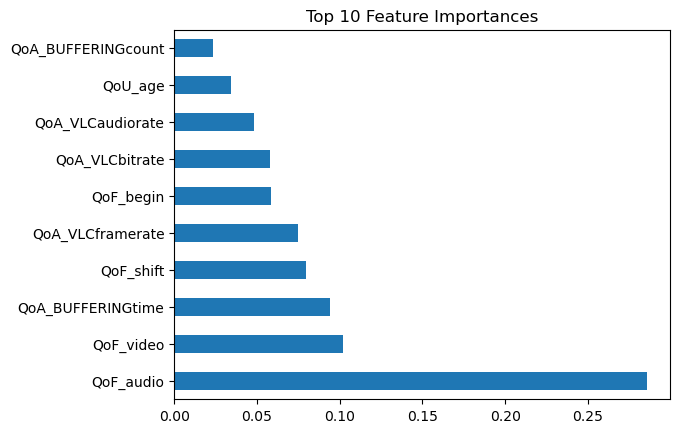

In [28]:
import matplotlib.pyplot as plt

# Feature importance from Random Forest
feature_importances = pd.Series(clf.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Top 10 Feature Importances')
plt.show()


## Define GridSearchCV and Perform Hyperparameter Tuning

In [29]:
# Define the model
rf = RandomForestClassifier(random_state=42)

# Set up hyperparameters for tuning
param_grid_rf = {
    'n_estimators': [50, 100, 200],        # Number of trees
    'max_depth': [None, 10, 20, 30],        # Maximum depth of trees
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],          # Minimum samples required at leaf node
    'max_features': ['auto', 'sqrt', 'log2'] # Number of features to consider for each split
}

# Initialize GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit the model
grid_search_rf.fit(X_train, y_train)

# Best hyperparameters and model
print("Best Hyperparameters for Random Forest:", grid_search_rf.best_params_)
best_rf = grid_search_rf.best_estimator_

# Evaluate the model
y_pred_rf = best_rf.predict(X_test)
print("Accuracy after tuning (Random Forest):", accuracy_score(y_test, y_pred_rf))


Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_spli

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:547: FitFailedWarning: 
540 fits failed out of a total of 1620.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
259 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py", line 1467, in wrapper
    estimator._validate_params()
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/opt/anaconda3/lib/python3.12/site-

In [30]:
import xgboost as xgb

# Define the model
xgb_model = xgb.XGBClassifier(random_state=42, objective='binary:logistic')

# Set up hyperparameters for tuning
param_grid_xgb = {
    'n_estimators': [50, 100, 200],          # Number of boosting rounds
    'learning_rate': [0.01, 0.05, 0.1],      # Step size
    'max_depth': [3, 6, 10],                  # Maximum depth of trees
    'min_child_weight': [1, 3, 5],            # Minimum sum of instance weight
    'subsample': [0.7, 0.8, 1.0]             # Fraction of samples for each round
}

# Initialize GridSearchCV
grid_search_xgb = GridSearchCV(estimator=xgb_model, param_grid=param_grid_xgb, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit the model
grid_search_xgb.fit(X_train, y_train)

# Best hyperparameters and model
print("Best Hyperparameters for XGBoost:", grid_search_xgb.best_params_)
best_xgb = grid_search_xgb.best_estimator_

# Evaluate the model
y_pred_xgb = best_xgb.predict(X_test)
print("Accuracy after tuning (XGBoost):", accuracy_score(y_test, y_pred_xgb))


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5

In [31]:
y_train.unique()

array([0, 1])

In [32]:
import lightgbm as lgb

# Define the model
lgbm_model = lgb.LGBMClassifier(random_state=42)

param_grid_lgbm = {
    'n_estimators': [50, 100,200],              # Reduce number of options
    'learning_rate': [0.01, 0.05, 0.1],          # Focus on common values
    'num_leaves': [31, 63],                # Reduce complexity
    'max_depth': [3, 6, 10]                  # Narrow depth range
}


# Initialize GridSearchCV
grid_search_lgbm = GridSearchCV(estimator=lgbm_model, param_grid=param_grid_lgbm, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit the model
grid_search_lgbm.fit(X_train, y_train)

# Best hyperparameters and model
print("Best Hyperparameters for LightGBM:", grid_search_lgbm.best_params_)
best_lgbm = grid_search_lgbm.best_estimator_

# Evaluate the model
y_pred_lgbm = best_lgbm.predict(X_test)
print("Accuracy after tuning (LightGBM):", accuracy_score(y_test, y_pred_lgbm))


Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimato

In [33]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Initialize Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=1000)

# Fit the model on the training data
logistic_model.fit(X_train, y_train)

# Predict on the test set
y_pred_logistic = logistic_model.predict(X_test)

# Calculate accuracy
accuracy_logistic = accuracy_score(y_test, y_pred_logistic)
print("Accuracy (Logistic Regression):", accuracy_logistic)


Accuracy (Logistic Regression): 0.8898488120950324


Logistic Regression performed better because:

The data likely exhibits linear patterns, which Logistic Regression handles well.
Logistic Regression is simpler, less prone to overfitting, and well-suited for smaller or less complex datasets.
XGBoost’s complexity may not have been fully utilized due to the dataset's nature or suboptimal hyperparameter tuning.

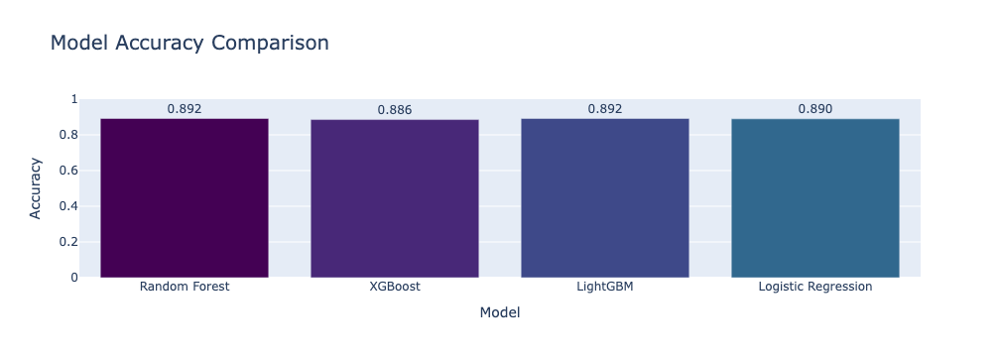

In [34]:
import plotly.express as px

# Define data for the plot
results = {
    'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test, y_pred_rf),
        accuracy_score(y_test, y_pred_xgb),
        accuracy_score(y_test, y_pred_lgbm),
        accuracy_logistic
    ]
}

# Create a DataFrame for Plotly
results_df = pd.DataFrame(results)

# Create an interactive bar chart
fig = px.bar(
    results_df,
    x='Model',
    y='Accuracy',
    text='Accuracy',  # Display accuracy values on bars
    title='Model Accuracy Comparison',
    labels={'Accuracy': 'Accuracy Score', 'Model': 'Model Name'},
    color='Model',  # Different colors for each bar
    color_discrete_sequence=px.colors.sequential.Viridis
)

# Enhance interactivity and appearance
fig.update_traces(texttemplate='%{text:.3f}', textposition='outside')
fig.update_layout(
    title_font_size=20,
    xaxis_title='Model',
    yaxis_title='Accuracy',
    yaxis=dict(range=[0, 1]),  # Set y-axis range to 0-1 (accuracy range)
    showlegend=False  # Hide legend as Model names are already on x-axis
)

# Show interactive plot
fig.show()


User Behavior Analysis

Correlation Matrix:
            QoU_age  retention
QoU_age    1.000000  -0.039009
retention -0.039009   1.000000


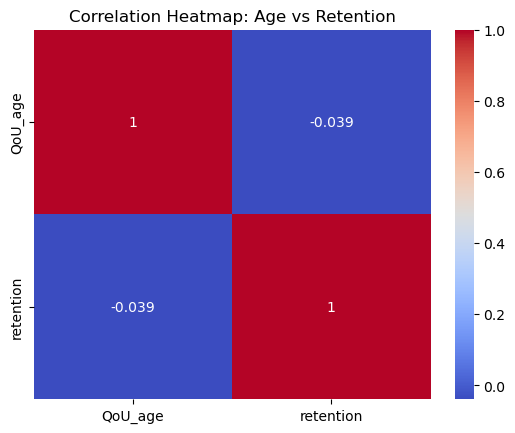

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [39]:
# Analyze correlations between numerical demographics and retention
correlation_matrix = data[['QoU_age', 'retention']].corr()

print("Correlation Matrix:")
print(correlation_matrix)

# Heatmap visualization
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap: Age vs Retention")
plt.show()


In [40]:
# Analyze retention by gender
gender_retention = data.groupby('QoU_sex')['retention'].mean().reset_index()

print("Retention by Gender:")
print(gender_retention)


Retention by Gender:
   QoU_sex  retention
0        0   0.605381
1        1   0.720455


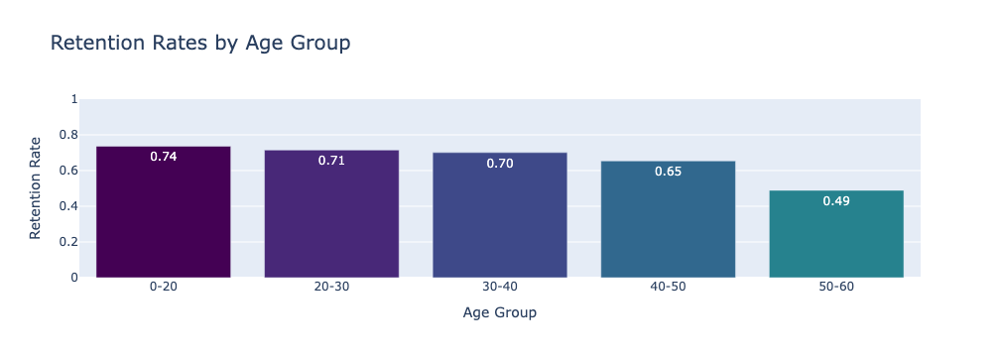

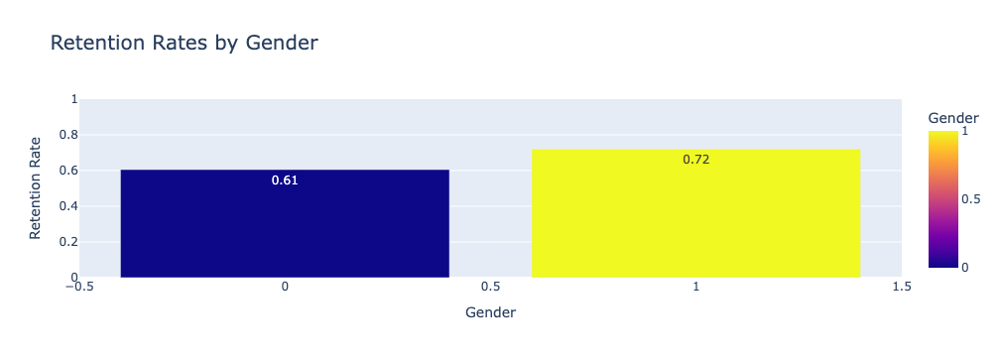

In [44]:
import plotly.express as px

# Retention rates by age groups
data['age_group'] = pd.cut(
    data['QoU_age'], 
    bins=[0, 20, 30, 40, 50, 60, 100], 
    labels=['0-20', '20-30', '30-40', '40-50', '50-60', '60+']
)
age_retention = data.groupby('age_group', observed=True)['retention'].mean().reset_index()

# Plot retention rates by age group
fig = px.bar(
    age_retention,
    x='age_group',
    y='retention',
    text='retention',
    title='Retention Rates by Age Group',
    labels={'retention': 'Retention Rate', 'age_group': 'Age Group'},
    color='age_group',
    color_discrete_sequence=px.colors.sequential.Viridis
)

# Format text and improve layout
fig.update_traces(
    texttemplate='%{text:.2f}',  # Limit decimal places for better readability
    textposition='inside'       # Place the text inside the bars
)
fig.update_layout(
    title_font_size=20,
    xaxis_title='Age Group',
    yaxis_title='Retention Rate',
    yaxis=dict(range=[0, 1]),   # Ensure bars fit within the graph by setting range
    showlegend=False,
    uniformtext_minsize=12,     # Uniform text size
    uniformtext_mode='hide'     # Prevent text from overlapping if bars are small
)

fig.show()

# Plot retention rates by gender
gender_retention = data.groupby('QoU_sex', observed=True)['retention'].mean().reset_index()

fig = px.bar(
    gender_retention,
    x='QoU_sex',
    y='retention',
    text='retention',
    title='Retention Rates by Gender',
    labels={'retention': 'Retention Rate', 'QoU_sex': 'Gender'},
    color='QoU_sex',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Format text and improve layout
fig.update_traces(
    texttemplate='%{text:.2f}',  # Limit decimal places
    textposition='inside'       # Place text inside bars
)
fig.update_layout(
    title_font_size=20,
    xaxis_title='Gender',
    yaxis_title='Retention Rate',
    yaxis=dict(range=[0, 1]),   # Ensure bars fit within the graph by setting range
    showlegend=False,
    uniformtext_minsize=12,
    uniformtext_mode='hide'
)

fig.show()


In [43]:
# Add new features based on demographic analysis
data['is_young_adult'] = (data['QoU_age'] >= 20) & (data['QoU_age'] < 30)
data['is_female'] = (data['QoU_sex'] == 'Female').astype(int)

# Include these features in the predictive model
X = data.drop(columns=['retention', 'id', 'user_id'])
y = data['retention']
